# EDA and Visualization Final Project: Data Prep and Analysis
## Zachary Barnes and Bing Wang

##### Housekeeping

In [1]:
# Load Python libraries
import os
import numpy as np
import pandas as pd

# Run R code adjacent to Python code
%load_ext rpy2.ipython

# Load ggplot R library
%R library(ggplot2)
%R library(scales)

# Avoid kernal death
os.environ['KMP_DUPLICATE_LIB_OK']='True'

# Read in and organize data (Collisions and Victims datasets, from TIMS)

In [13]:
c = pd.read_csv("Collisions.csv")

# Keep only relevant columns
c = c[['CASE_ID','COLLISION_DATE','COLLISION_TIME','INTERSECTION','COLLISION_SEVERITY',
       'LIGHTING','LOCATION_TYPE', 'ROAD_SURFACE', 'ROAD_COND_1', 'PEDESTRIAN_ACCIDENT',
       'BICYCLE_ACCIDENT', 'MOTORCYCLE_ACCIDENT', 'TRUCK_ACCIDENT', 'ALCOHOL_INVOLVED',
       'LATITUDE','LONGITUDE','PRIMARY_RD','SECONDARY_RD','POINT_X','POINT_Y']]

# Convert COLLISION_TIME to hour of day (use tlater to match speeds to collisions)
c['COLLISION_TIME'] = [int(i[:-2]) if len(i) > 2 else 0 for i in c['COLLISION_TIME'].astype(str).values]

# Make Collision_Date a DateTime object
c["COLLISION_DATE"] = pd.to_datetime(c.COLLISION_DATE)

# Add quarter column (use later in match speeds to collisions)
c['QUARTER'] = c['COLLISION_DATE'].map(pd.to_datetime).dt.quarter

print(len(c))
c.sample(5)

3870


,CASE_ID,COLLISION_DATE,COLLISION_TIME,INTERSECTION,COLLISION_SEVERITY,LIGHTING,LOCATION_TYPE,ROAD_SURFACE,ROAD_COND_1,PEDESTRIAN_ACCIDENT,...,MOTORCYCLE_ACCIDENT,TRUCK_ACCIDENT,ALCOHOL_INVOLVED,LATITUDE,LONGITUDE,PRIMARY_RD,SECONDARY_RD,POINT_X,POINT_Y,QUARTER
2235,8636954,2018-05-27,2,N,3,C,NaN,A,H,NaN,...,NaN,NaN,Y,NaN,NaN,SAN CARLOS ST,21ST ST,-122.419720,37.757241,2
474,8777112,2018-12-14,17,Y,3,C,NaN,B,H,Y,...,NaN,NaN,NaN,NaN,NaN,BUSH ST,LYON ST,-122.445020,37.785540,4
2352,8636817,2018-05-12,22,N,2,C,NaN,A,H,Y,...,NaN,NaN,Y,NaN,NaN,POST ST,BUCHANAN ST,-122.429979,37.785553,2
3605,90788811,2018-08-02,21,N,4,D,NaN,A,H,NaN,...,NaN,NaN,NaN,37.77001,-122.419,US-101 N/B,MISSION ST. UNDERCROSSING,-122.418994,37.770051,3
2423,8623569,2018-03-28,6,Y,4,B,NaN,A,H,NaN,...,NaN,NaN,NaN,NaN,NaN,MARKET ST,GOUGH ST,-122.422210,37.772870,1


In [14]:
# recode variables in Collision (as 1s and 0s, reduce categories down, make dummies)

# NOTE: ROAD_SURFACE and ROAD_COND_1 had some observations unstated
# If not stated, assumed no issues with road surface or con'd

# Intersection: Make dummy, intersection/not
c.loc[c.INTERSECTION == "Y", "INTERSECTION"] = 1
c.loc[c.INTERSECTION == "N", "INTERSECTION"] = 0
# Lighting: Make 1, 2, 3 for ordinal values for light, dusk/dawn, dark
c.loc[c.LIGHTING == "A", "LIGHTING"] = 2  # Light
c.loc[c.LIGHTING == "B", "LIGHTING"] = 1  # Dusk/Dawn
c.loc[c.LIGHTING.isin(["C", "D", "E"]), "LIGHTING"] = 0  # Dark (w and w/o streetlight)
# Road_Surface: Convert to dummy, wet/not 
c.loc[c.ROAD_SURFACE.isin(["B", "C", "D"]), "WET_ROAD_SURFACE"] = 1
c.loc[~(c.ROAD_SURFACE.isin(["B", "C", "D"])), "WET_ROAD_SURFACE"] = 0
# Road_Cond_1: Convert to dummy, issue/not
c.loc[c.ROAD_COND_1.isin(["H", ""]), "ROAD_COND_ISSUE"] = 0
c.loc[~(c.ROAD_COND_1.isin(["H", ""])), "ROAD_COND_ISSUE"] = 1

In [15]:
v = pd.read_csv('Victims.csv')

# Keep only relevant columns
v = v[['CASE_ID','VICTIM_DEGREE_OF_INJURY','VICTIM_ROLE','VICTIM_AGE']]

# Keep only fatalities and severe injuries (Victim_Degree_of_Injury = 1 or 2)
v = v.loc[v.VICTIM_DEGREE_OF_INJURY.isin([1, 2])]

print(len(v))
v.sample(5)

289


,CASE_ID,VICTIM_DEGREE_OF_INJURY,VICTIM_ROLE,VICTIM_AGE
4354,8573846,2,1,23
3806,8599722,2,2,31
200,8777316,2,2,29
282,8777265,2,1,32
3536,8619272,2,3,60


In [17]:
# need Y values to be 0 or 1 for logistic reg
v.loc[v.VICTIM_DEGREE_OF_INJURY == 1, "VDOI_dummy"] = 1
v.loc[v.VICTIM_DEGREE_OF_INJURY == 2, "VDOI_dummy"] = 0

v.sample(5)

,CASE_ID,VICTIM_DEGREE_OF_INJURY,VICTIM_ROLE,VICTIM_AGE,VDOI_dummy
4994,8465594,1,3,34,1.0
3763,8602972,2,1,18,0.0
481,8764295,2,1,43,0.0
305,8777250,2,1,37,0.0
2800,8656280,2,3,24,0.0


In [18]:
# Merge Collisions and Victims datasets
cv = pd.merge(c, v, how='left', on='CASE_ID')

print(len(cv))
print(cv.COLLISION_SEVERITY.value_counts())
print(cv.VICTIM_DEGREE_OF_INJURY.value_counts())
cv.head()

len(cv.loc[~(cv.VICTIM_DEGREE_OF_INJURY.isna())])

3882
4    2549
3    1014
2     294
1      25
Name: COLLISION_SEVERITY, dtype: int64
2.0    262
1.0     25
Name: VICTIM_DEGREE_OF_INJURY, dtype: int64


287

In [19]:
# Paul's Function to remove NaNs from columns
def fixDFcolsForR(myDF):
    for i in range(myDF.shape[1]): # for each col
        if myDF.iloc[:, i].dtype == 'O': # check if col is type object
            myDF.iloc[:, i] = myDF.iloc[:, i].astype(str) # if yes set type to string
    return myDF

In [20]:
# Convert NaNs to string type
cv = fixDFcolsForR(cv)
cv.sample(5)

,CASE_ID,COLLISION_DATE,COLLISION_TIME,INTERSECTION,COLLISION_SEVERITY,LIGHTING,LOCATION_TYPE,ROAD_SURFACE,ROAD_COND_1,PEDESTRIAN_ACCIDENT,...,SECONDARY_RD,POINT_X,POINT_Y,QUARTER,WET_ROAD_SURFACE,ROAD_COND_ISSUE,VICTIM_DEGREE_OF_INJURY,VICTIM_ROLE,VICTIM_AGE,VDOI_dummy
1331,8716367,2018-09-22,11,1,4,2,nan,A,H,Y,...,OCEAN AV,-122.437540,37.723700,3,0.0,0.0,NaN,NaN,NaN,NaN
3731,90837941,2018-10-05,16,0,4,2,R,A,H,nan,...,4TH STREET,-122.399730,37.780220,4,0.0,0.0,NaN,NaN,NaN,NaN
2699,8598020,2018-03-27,4,0,2,0,nan,A,H,nan,...,JERROLD AV,-122.389340,37.738836,1,0.0,0.0,2.0,2.0,65.0,0.0
3009,8573877,2018-02-22,18,0,4,0,nan,A,H,nan,...,CALIFORNIA ST,-122.420672,37.790529,1,0.0,0.0,NaN,NaN,NaN,NaN
763,8758082,2018-11-07,22,1,4,0,nan,A,H,nan,...,TAYLOR ST,-122.415440,37.806360,4,0.0,0.0,NaN,NaN,NaN,NaN


In [21]:
# for dummies: recode Y as 1, blank as 0
def Yfor1(df):
    df = df.replace("Y", 1)
    df = df.replace("nan", 0)
    return df

In [22]:
cv["PEDESTRIAN_ACCIDENT"] = Yfor1(cv.PEDESTRIAN_ACCIDENT)
cv["BICYCLE_ACCIDENT"] = Yfor1(cv.BICYCLE_ACCIDENT)
cv["MOTORCYCLE_ACCIDENT"] = Yfor1(cv.MOTORCYCLE_ACCIDENT)
cv["TRUCK_ACCIDENT"] = Yfor1(cv.TRUCK_ACCIDENT)

In [23]:
cv.sample(10)

,CASE_ID,COLLISION_DATE,COLLISION_TIME,INTERSECTION,COLLISION_SEVERITY,LIGHTING,LOCATION_TYPE,ROAD_SURFACE,ROAD_COND_1,PEDESTRIAN_ACCIDENT,...,SECONDARY_RD,POINT_X,POINT_Y,QUARTER,WET_ROAD_SURFACE,ROAD_COND_ISSUE,VICTIM_DEGREE_OF_INJURY,VICTIM_ROLE,VICTIM_AGE,VDOI_dummy
3201,8556690,2018-01-12,14,1,4,2,nan,A,H,0,...,EVANS AV,-122.388010,37.742730,1,0.0,0.0,NaN,NaN,NaN,NaN
1007,8754695,2018-10-10,7,1,4,2,nan,A,H,0,...,PARIS ST,-122.435580,37.720800,4,0.0,0.0,NaN,NaN,NaN,NaN
3046,8573836,2018-02-11,19,0,4,2,nan,A,H,1,...,SACRAMENTO ST,-122.412647,37.792583,1,0.0,0.0,NaN,NaN,NaN,NaN
105,90690080,2018-03-14,17,0,4,2,nan,A,H,0,...,PAUL AVE,-122.401229,37.724088,1,0.0,0.0,NaN,NaN,NaN,NaN
787,8756719,2018-11-11,10,1,4,2,nan,A,H,0,...,MISSION ST,-122.394970,37.791860,4,0.0,0.0,NaN,NaN,NaN,NaN
2197,8637014,2018-05-24,17,1,3,2,nan,A,H,1,...,MAIN ST,-122.393400,37.790620,2,0.0,0.0,NaN,NaN,NaN,NaN
1470,8698205,2018-08-26,20,1,3,0,nan,A,H,0,...,LINDA ST,-122.422860,37.760020,3,0.0,0.0,NaN,NaN,NaN,NaN
1052,8747106,2018-10-24,15,1,4,2,nan,A,H,0,...,POLK ST,-122.418220,37.778480,4,0.0,0.0,NaN,NaN,NaN,NaN
1999,8656311,2018-06-05,18,1,4,2,nan,A,H,0,...,STOCKTON ST,-122.410300,37.806040,2,0.0,0.0,NaN,NaN,NaN,NaN
1860,8667490,2018-06-14,16,1,2,2,nan,A,H,1,...,9TH AV,-122.466440,37.766380,2,0.0,0.0,2.0,3.0,54.0,0.0


Now, we need to attach Open Street Maps (OSM) way IDs to each observation in the Collisions-Victims dataset, in order to match with the speed dataset. An OSM way ID is an ID that matches latitude and longitude to a street segment.

# Use Nominatim API to convert lat long to OSM ID

In [24]:
# import requests
# import json

# def osmid(lat,lon):
#     URL = 'https://nominatim.openstreetmap.org/reverse?format=json&lat=%s&lon=%s'
#     r = requests.get(URL % (lat,lon))
#     data = json.loads(r.text)
# #     osm_id = data.get('osm_id','NONE')
#     return data['osm_id']


This code snippet below creates osm.csv, a list of OSM IDS and their latitudes and longitudes. We will use this to attach OSM IDs to our Collisions-Victims dataset.

In [25]:
# import time
# lat_long = cv[['POINT_Y','POINT_X','VICTIM_DEGREE_OF_INJURY']]
# osm_id = list()
# for i,row in lat_long.iterrows():
#     if (np.isnan(row['POINT_Y']) or np.isnan(row['POINT_X'])) or np.isnan(row['VICTIM_DEGREE_OF_INJURY']):
#         osm_id.append('NONE')
#         continue
#     else:
#         time.sleep(2)
#         osm_id.append(osmid(row['POINT_Y'],row['POINT_X']))
# osm_series = pd.Series(osm_id)
# osm_series.to_csv('osm.csv')

# Add OSM_ID column 

In [26]:
# since we have preprocessed and saved OSM ID data, just read in as csv
osm = pd.read_csv('osm.csv',header=None)
osm.columns = ['index','OSM_ID']
cv['OSM_ID'] = osm['OSM_ID']

print(len(cv))
print(len(osm))
cv.loc[~(cv.VICTIM_DEGREE_OF_INJURY.isna())].sample(5)

3882
3882


,CASE_ID,COLLISION_DATE,COLLISION_TIME,INTERSECTION,COLLISION_SEVERITY,LIGHTING,LOCATION_TYPE,ROAD_SURFACE,ROAD_COND_1,PEDESTRIAN_ACCIDENT,...,POINT_X,POINT_Y,QUARTER,WET_ROAD_SURFACE,ROAD_COND_ISSUE,VICTIM_DEGREE_OF_INJURY,VICTIM_ROLE,VICTIM_AGE,VDOI_dummy,OSM_ID
2709,8597300,2018-03-29,16,0,2,2,R,A,H,0,...,-122.447262,37.724114,1,0.0,0.0,2.0,4.0,61.0,0.0,689603996
2291,8636891,2018-05-02,18,0,2,2,nan,A,H,0,...,-122.429713,37.802608,2,0.0,0.0,2.0,4.0,31.0,0.0,85644906
3239,8553201,2018-01-14,22,0,2,0,nan,A,H,0,...,-122.423873,37.772689,1,0.0,0.0,2.0,1.0,38.0,0.0,415307827
3136,8572816,2018-02-04,18,0,2,0,nan,A,H,0,...,-122.437074,37.759662,1,0.0,0.0,2.0,4.0,39.0,0.0,87200814
2512,8619257,2018-04-17,8,0,2,2,nan,A,H,1,...,-122.397074,37.790163,2,0.0,0.0,2.0,3.0,49.0,0.0,88572970


# Load in Uber Speeds dataset

Load avgspeeds.csv, the Uber Speeds dataset, and reduce down to speeds.csv (see comment below code)

In [27]:
# avgspeeds = pd.read_csv('avgspeeds.csv')
# avgspeeds.head()

In [28]:
# speeds = list()
# for i, row in cvsmall.iterrows():
#     speed = avgspeeds.loc[(avgspeeds['osm_way_id'] == row['OSM_ID']) & 
#               (avgspeeds['quarter'] == row['QUARTER']) & 
#               (avgspeeds['hour_of_day'] == row['COLLISION_TIME'])]['speed_mph_mean']
#     if speed.values.size > 0:
#          speeds.append(speed.values[0])
        
#     else:
#         speeds.append(0)
# speeds = pd.Series(speeds)
# speeds.to_csv('speeds.csv')


In [29]:
# Reduce cv DataFrame to only entries with non-null Quarter, Collision_Time, and OSM_ID 
# before joining to avgspeeds
cvsmall = cv.loc[(~cv['QUARTER'].isna()) & (~cv['COLLISION_TIME'].isna()) & ~(cv['OSM_ID'] == 'NONE')]
#cvsmall['OSM_ID'] = cvsmall['OSM_ID'].astype(int)

# NOTE 10/1: Commented out as this resulting in error "AttributeError: 'int' object has no attribute 'encode'"

# There are 271 entries.
len(cv.loc[~(cv['OSM_ID'] == 'NONE')])

271

The code below produces speeds.csv, a subset of averagespeeds.csv. It reduces the speeds observations down to ones that would match the Collisions-Victims dataset on OSD_ID, Quarter, and Collision_Time. If there is no match, set speed = 0.

Now, we join cvsmall (the reduced Collisions-Victims dataset) to the speeds dataset.

In [30]:
speeds = pd.read_csv("speeds.csv",header=None)

cvsmall["SPEEDS"] = speeds[1].to_list()
cvsmall.head()

/Users/zacharybarnes/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,CASE_ID,COLLISION_DATE,COLLISION_TIME,INTERSECTION,COLLISION_SEVERITY,LIGHTING,LOCATION_TYPE,ROAD_SURFACE,ROAD_COND_1,PEDESTRIAN_ACCIDENT,...,POINT_Y,QUARTER,WET_ROAD_SURFACE,ROAD_COND_ISSUE,VICTIM_DEGREE_OF_INJURY,VICTIM_ROLE,VICTIM_AGE,VDOI_dummy,OSM_ID,SPEEDS
251,8804185,2018-12-29,18,1,2,0,nan,A,H,0,...,37.746940,4,0.0,0.0,2.0,1.0,32.0,0.0,148313526,7.753
254,8796720,2018-12-10,13,0,2,2,nan,A,H,0,...,37.805128,4,0.0,0.0,2.0,1.0,30.0,0.0,2503369217,0.000
260,8796604,2018-12-28,18,0,2,0,nan,A,H,0,...,37.777302,4,0.0,0.0,2.0,1.0,39.0,0.0,3802986672,0.000
261,8796085,2018-12-11,15,0,2,2,nan,A,H,0,...,37.779838,4,0.0,0.0,2.0,1.0,45.0,0.0,467150002,0.000
266,8787863,2018-12-12,9,0,2,2,nan,A,H,1,...,37.774759,4,0.0,0.0,2.0,2.0,998.0,0.0,27553863,0.000


Drop accidents on highways (not covered by Vision Zero SF)

In [31]:
cvsmall = cvsmall.loc[cvsmall.LOCATION_TYPE != "H"]
len(cvsmall)

266

# Preliminary graphs (without speed or regressions)

In [32]:
# fix NaNs with Paul's function before passing to R
cvsmall = fixDFcolsForR(cvsmall)

In [33]:
cvsmall.dtypes

CASE_ID                             int64
COLLISION_DATE             datetime64[ns]
COLLISION_TIME                      int64
INTERSECTION                       object
COLLISION_SEVERITY                  int64
LIGHTING                           object
LOCATION_TYPE                      object
ROAD_SURFACE                       object
ROAD_COND_1                        object
PEDESTRIAN_ACCIDENT                 int64
BICYCLE_ACCIDENT                    int64
MOTORCYCLE_ACCIDENT                 int64
TRUCK_ACCIDENT                      int64
ALCOHOL_INVOLVED                   object
LATITUDE                          float64
LONGITUDE                         float64
PRIMARY_RD                         object
SECONDARY_RD                       object
POINT_X                           float64
POINT_Y                           float64
QUARTER                             int64
WET_ROAD_SURFACE                  float64
ROAD_COND_ISSUE                   float64
VICTIM_DEGREE_OF_INJURY           

In [34]:
# Add column of months for graphing time series
cvsmall["Month"] = cvsmall.COLLISION_DATE.dt.month

len(cvsmall)

# Aggregate up to month
cvsmall_m = cvsmall.groupby(["VICTIM_DEGREE_OF_INJURY", "Month"]).count().reset_index()

In [35]:
cvs = cvsmall.loc[cvsmall.SPEEDS != 0]
cvs.head()
print(cvs.VICTIM_DEGREE_OF_INJURY.value_counts())
len(cvs)

2.0    94
1.0     7
Name: VICTIM_DEGREE_OF_INJURY, dtype: int64


101

# Chart 1: Time Series line graph of incidences of accidents
(maybe try: cumulative?)

In [37]:
%R -i cvsmall
%R -i cvsmall_m
%R -i cvs

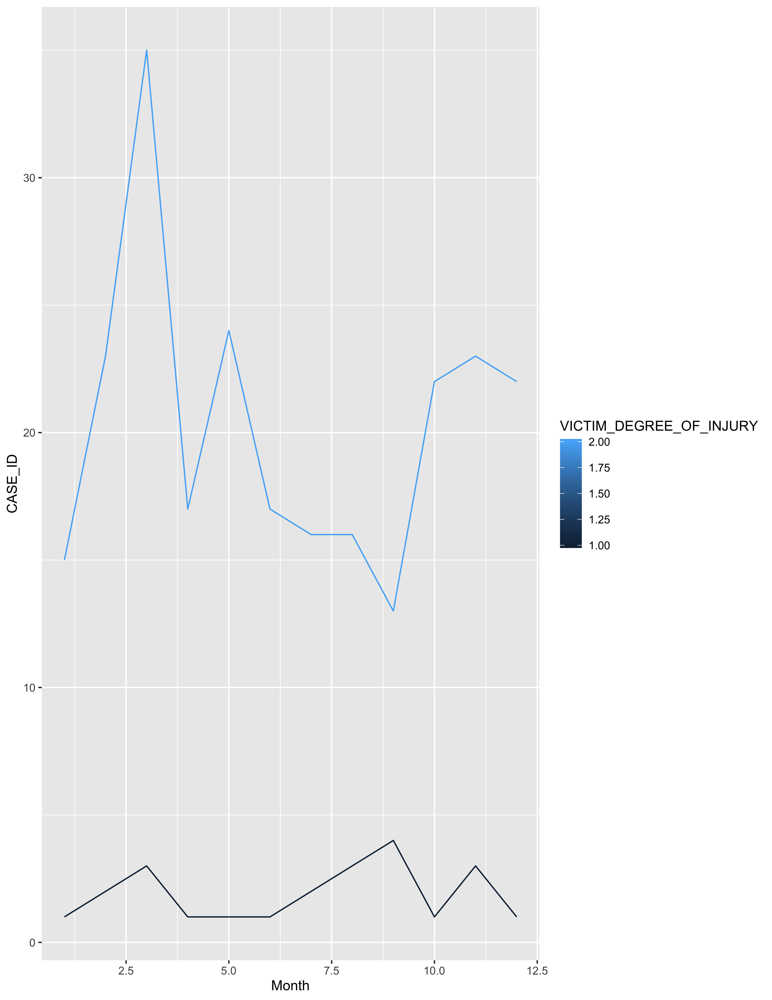

In [39]:
%%R -w 8.5 -h 11 --units in -r 400

ggplot() + 
geom_line(aes(x = Month, y = CASE_ID, group = VICTIM_DEGREE_OF_INJURY, color = VICTIM_DEGREE_OF_INJURY), 
          data = cvsmall_m, stat = "identity") 



# Chart 2: Map

R[write to console]: Using zoom = 13...



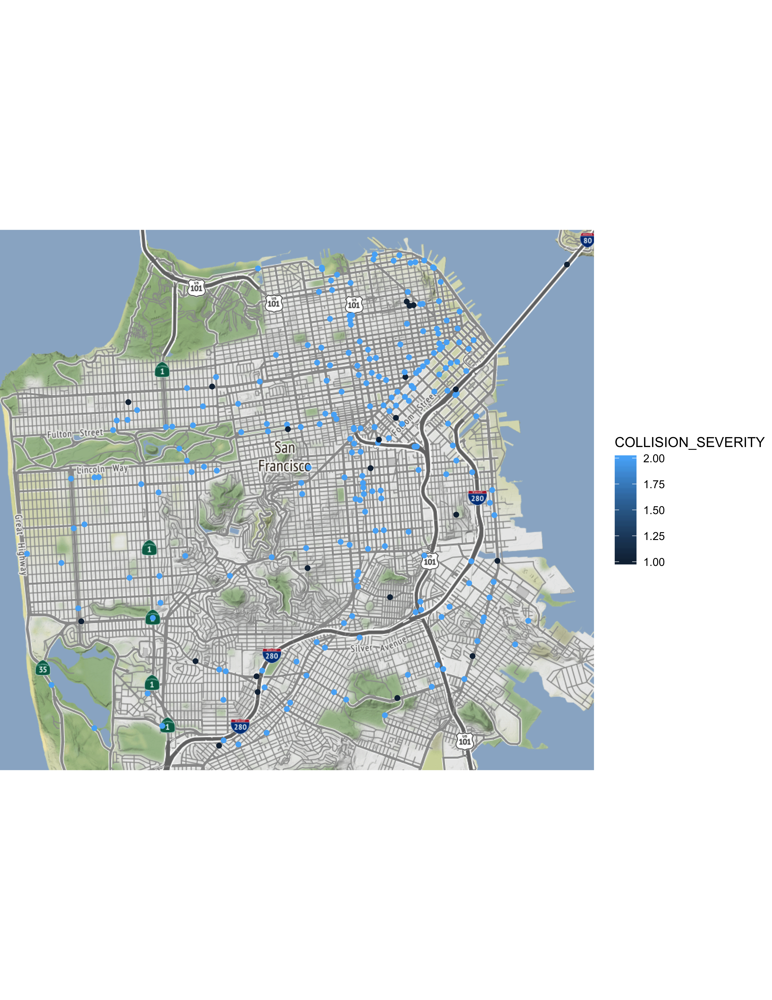

In [75]:
%%R -w 8.5 -h 11 --units in -r 400

qmplot(POINT_X, POINT_Y, data = cvsmall, maptype = "toner-lite", color = COLLISION_SEVERITY)

# Chart 3: Box plot showing spread of speeds by victim degree of injury

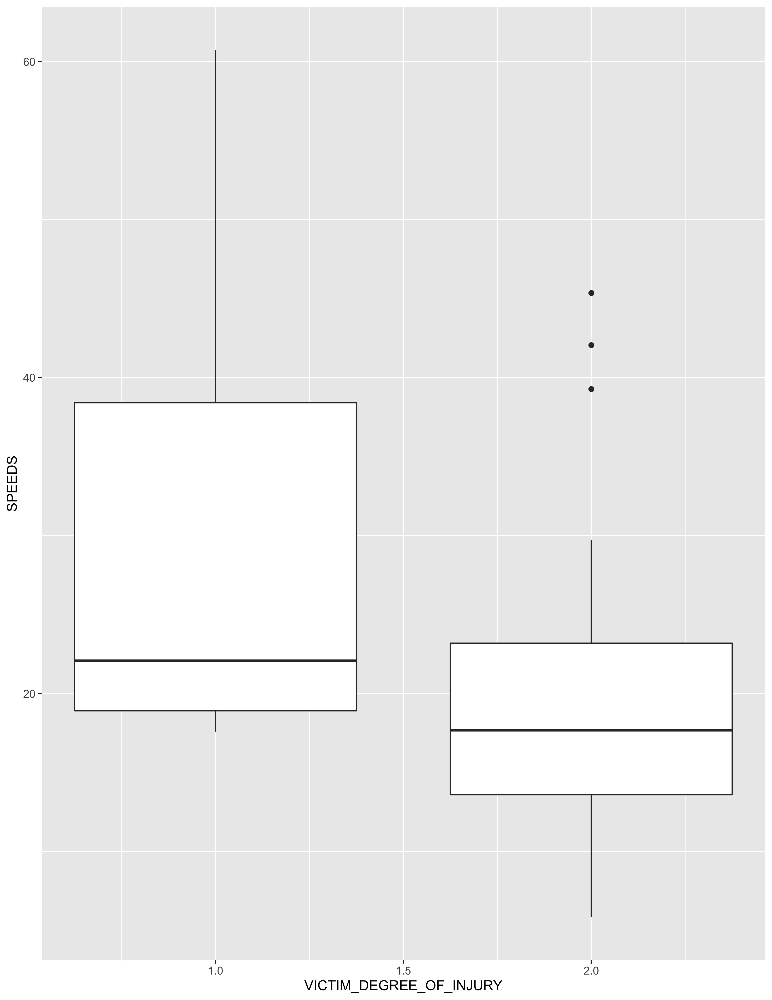

In [40]:
%%R -w 8.5 -h 11 --units in -r 400

ggplot() + 
    geom_boxplot(aes(x=VICTIM_DEGREE_OF_INJURY, y=SPEEDS, group = VICTIM_DEGREE_OF_INJURY),data=cvs)

# (Optional) Chart ?: Histogram of ages by victim degree of injury 
(purpose: try to show that as age goes up, fatalities go up (?))

In [41]:
# remove nonsensical/placeholder VICTIM_AGE (=998?)
v_cleanage = v.loc[v.VICTIM_AGE < 150]
v_cleanage = v_cleanage.groupby(["VICTIM_DEGREE_OF_INJURY", "VICTIM_AGE"]).count().reset_index()
v_cleanage.dtypes

VICTIM_DEGREE_OF_INJURY    int64
VICTIM_AGE                 int64
CASE_ID                    int64
VICTIM_ROLE                int64
VDOI_dummy                 int64
dtype: object

In [42]:
%R -i v_cleanage

R[write to console]: Warning:
R[write to console]:  Ignoring unknown parameters: binwidth, bins, pad



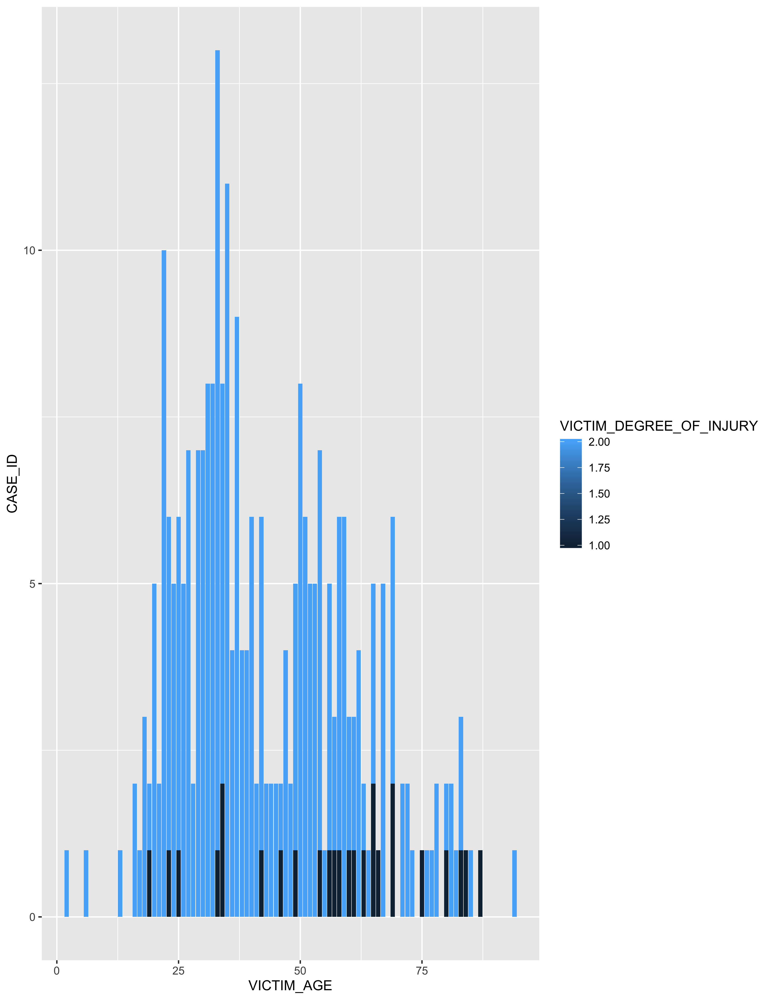

In [43]:
%%R -w 8.5 -h 11 --units in -r 400

ggplot() + 
geom_histogram(aes(x = VICTIM_AGE, y = CASE_ID, fill = VICTIM_DEGREE_OF_INJURY), data = v_cleanage, 
               stat = "identity", binwidth = 10)


# Chart 4: Scatterplot of age vs. speed by Victim Degree of Injury

In [44]:
cvs.head()

,CASE_ID,COLLISION_DATE,COLLISION_TIME,INTERSECTION,COLLISION_SEVERITY,LIGHTING,LOCATION_TYPE,ROAD_SURFACE,ROAD_COND_1,PEDESTRIAN_ACCIDENT,...,QUARTER,WET_ROAD_SURFACE,ROAD_COND_ISSUE,VICTIM_DEGREE_OF_INJURY,VICTIM_ROLE,VICTIM_AGE,VDOI_dummy,OSM_ID,SPEEDS,Month
251,8804185,2018-12-29,18,1,2,0,nan,A,H,0,...,4,0.0,0.0,2.0,1.0,32.0,0.0,148313526,7.753,12
348,8777340,2018-12-01,22,0,2,0,nan,A,H,1,...,4,0.0,0.0,2.0,3.0,998.0,0.0,27396883,11.451,12
367,8777316,2018-12-02,22,1,2,0,nan,A,H,0,...,4,0.0,0.0,2.0,2.0,29.0,0.0,8914988,23.761,12
375,8777306,2018-12-27,13,1,2,2,nan,A,H,0,...,4,0.0,0.0,2.0,1.0,23.0,0.0,8916919,11.359,12
398,8777283,2018-12-28,16,1,2,2,nan,A,H,0,...,4,0.0,0.0,2.0,1.0,29.0,0.0,224384016,12.138,12


In [45]:
# drop the nonsensical/placeholder ages 
cvs_age = cvs.loc[cvs.VICTIM_AGE < 150]

In [46]:
# group by vic. deg. of inj. to plot mean ("centroid")
cvs_age_ag = cvs.groupby("VICTIM_DEGREE_OF_INJURY").median().reset_index()[["VICTIM_DEGREE_OF_INJURY", "VICTIM_AGE", "SPEEDS"]]
cvs_age_ag

,VICTIM_DEGREE_OF_INJURY,VICTIM_AGE,SPEEDS
0,1.0,60.0,22.0740
1,2.0,37.0,17.6825


In [47]:
%R -i cvs_age
%R -i cvs_age_ag

In [48]:
cvs.VICTIM_DEGREE_OF_INJURY.value_counts()

2.0    94
1.0     7
Name: VICTIM_DEGREE_OF_INJURY, dtype: int64

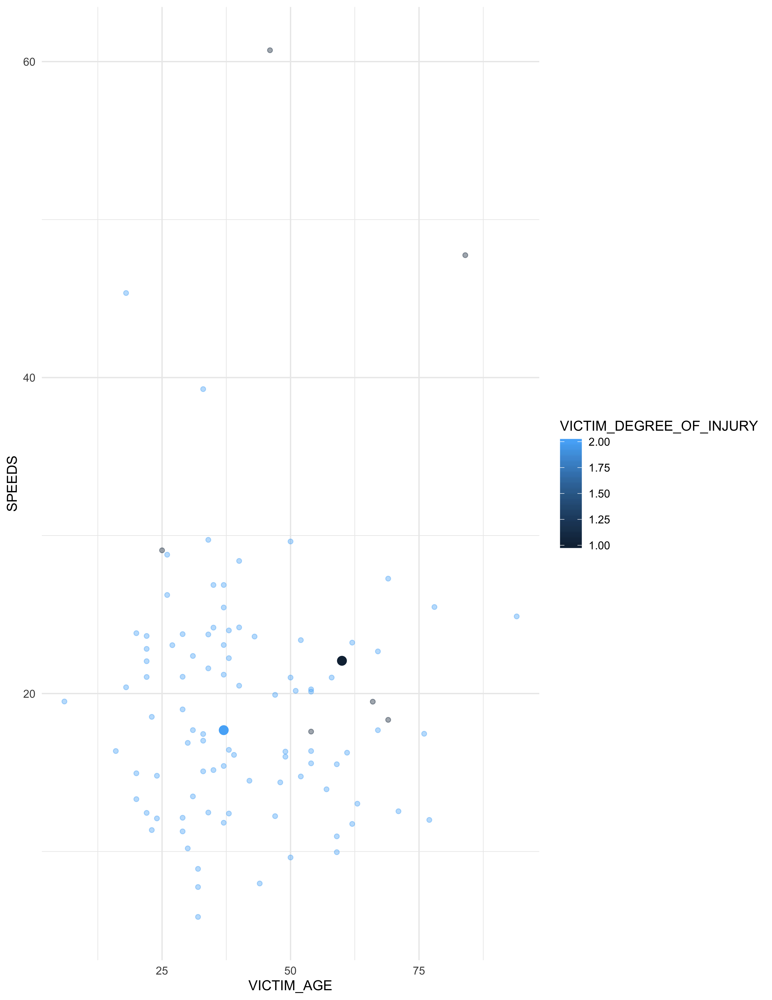

In [49]:
%%R -w 8.5 -h 11 --units in -r 400

ggplot() +
geom_point(aes(x = VICTIM_AGE, y = SPEEDS, color = VICTIM_DEGREE_OF_INJURY), data = cvs_age, alpha = 0.4) +
geom_point(aes(x = VICTIM_AGE, y = SPEEDS, color = VICTIM_DEGREE_OF_INJURY), data = cvs_age_ag, size = 3) +
theme_minimal()

# Bar chart: accidents (by severity) by parties involved

In [122]:
cvs_parties = cvs[['VICTIM_DEGREE_OF_INJURY', 'PEDESTRIAN_ACCIDENT',
                  'BICYCLE_ACCIDENT', 'MOTORCYCLE_ACCIDENT', 'TRUCK_ACCIDENT']]
cvs_parties = cvs_parties.groupby('VICTIM_DEGREE_OF_INJURY').sum().reset_index()
cvs_parties = cvs_parties.T
cvs_parties = cvs_parties[1:]

cvs_parties["Involved"] = ["Pedestrian", "Bicycle", "Motorcycle", "Truck"]
cvs_parties.columns = ["Fatalities", "Severe Injuries", "Involved"]
cvs_parties

,Fatalities,Severe Injuries,Involved
PEDESTRIAN_ACCIDENT,4.0,39.0,Pedestrian
BICYCLE_ACCIDENT,1.0,13.0,Bicycle
MOTORCYCLE_ACCIDENT,0.0,18.0,Motorcycle
TRUCK_ACCIDENT,0.0,1.0,Truck


In [128]:
cvs_parties = cvs[['VICTIM_DEGREE_OF_INJURY', 'PEDESTRIAN_ACCIDENT',
                  'BICYCLE_ACCIDENT', 'MOTORCYCLE_ACCIDENT', 'TRUCK_ACCIDENT']].T
cvs_parties["Parties"] = cvs_parties.index
cvs_parties

,251,348,367,375,398,429,441,508,545,570,...,3239,3252,3323,3430,3444,3452,3455,3647,3698,Parties
VICTIM_DEGREE_OF_INJURY,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,VICTIM_DEGREE_OF_INJURY
PEDESTRIAN_ACCIDENT,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,PEDESTRIAN_ACCIDENT
BICYCLE_ACCIDENT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,BICYCLE_ACCIDENT
MOTORCYCLE_ACCIDENT,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,MOTORCYCLE_ACCIDENT
TRUCK_ACCIDENT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,TRUCK_ACCIDENT


In [123]:
%R -i cvs_parties

In [100]:
%%R -w 8.5 -h 11 --units in -r 400

ggplot() +
geom_bar(aes(x = Involved, 
             group = VICTIM_DEGREE_OF_INJURY), data = cvs_parties, position = position_dodge())

R[write to console]: Error in FUN(X[[i]], ...) : object 'PEDESTRIAN_ACCIDENT' not found
Calls: <Anonymous> ... <Anonymous> -> f -> scales_add_defaults -> lapply -> FUN



RRuntimeError: Error in FUN(X[[i]], ...) : object 'PEDESTRIAN_ACCIDENT' not found
Calls: <Anonymous> ... <Anonymous> -> f -> scales_add_defaults -> lapply -> FUN


# Time of day and severity

In [ ]:
%%R

ggplot() +
geom_histogram(aes(x = cvs))